# Assignment 2

## Install 

In [2]:
%pip install panda-gym
%pip install numpngw
%pip install pyvirtualdisplay
%pip install gymnasium[classic_control]
%pip install stable-baselines3[extra]
%pip install git+https://github.com/DLR-RM/rl-baselines3-zoo.git

You should consider upgrading via the '/Users/nou./.pyenv/versions/3.10.0/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the '/Users/nou./.pyenv/versions/3.10.0/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the '/Users/nou./.pyenv/versions/3.10.0/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the '/Users/nou./.pyenv/versions/3.10.0/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
You should consider upgrading via the '/Users/nou./.pyenv/versions/3.10.0/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
  Cloning https://github.com/DLR-RM/rl-baselines3-

## Import

In [3]:
import gymnasium as gym
import panda_gym
from numpngw import write_apng
from IPython.display import Image
from stable_baselines3 import SAC

## Create environment and load model

In [10]:
env = gym.make("PandaPickAndPlace-v3", render_mode="rgb_array")
model = SAC("MultiInputPolicy", env, verbose=1)

argv[0]=--background_color_red=0.8745098114013672
argv[1]=--background_color_green=0.21176470816135406
argv[2]=--background_color_blue=0.1764705926179886
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


## Train model

In [11]:
model.learn(total_timesteps=1000000)

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -50      |
|    success_rate    | 0        |
| time/              |          |
|    episodes        | 4        |
|    fps             | 58       |
|    time_elapsed    | 3        |
|    total_timesteps | 200      |
| train/             |          |
|    actor_loss      | -4.54    |
|    critic_loss     | 0.0958   |
|    ent_coef        | 0.971    |
|    ent_coef_loss   | -0.198   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -50      |
|    success_rate    | 0        |
| time/              |          |
|    episodes        | 8        |
|    fps             | 37       |
|    time_elapsed    | 10       |
|    total_timesteps | 400      |
| train/             |          |
|    actor_los

## Save model


In [5]:
model.save("/Users/nou./Downloads/model")
env.close()


## Load saved model

In [6]:
# Load the saved model
model2 = SAC.load("/Users/nou./Downloads/model")

# Create environment
env2 = gym.make("PandaPickAndPlace-v3", render_mode="rgb_array")


argv[0]=--background_color_red=0.8745098114013672
argv[1]=--background_color_green=0.21176470816135406
argv[2]=--background_color_blue=0.1764705926179886


## Convert into animation and plot results

In [7]:
%pip install matplotlib

You should consider upgrading via the '/Users/nou./.pyenv/versions/3.10.0/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [8]:
import matplotlib.pyplot as plt

success_rates = []
episode_lengths = []
cumulative_rewards = []
cumulative_reward = 0
episode_length = 0

In [12]:
observation, info = env2.reset()
images = [env2.render()]
for _ in range(1000):
    action, _states = model2.predict(observation)
    observation, reward, terminated, truncated, info = env2.step(action)
    # Update cumulative reward and episode length
    cumulative_reward += reward
    episode_length += 1
    images.append(env2.render())

    if terminated or truncated:
        # Save success rate, episode length, and cumulative reward
        success_rates.append(info["is_success"])
        episode_lengths.append(episode_length)
        cumulative_rewards.append(cumulative_reward)
        # Reset cumulative reward and episode length
        cumulative_reward = 0
        episode_length = 0
        observation, info = env2.reset()
        images.append(env2.render())

write_apng("anim.png", images, delay=40)  # real-time rendering = 40 ms between frames

## Show animation

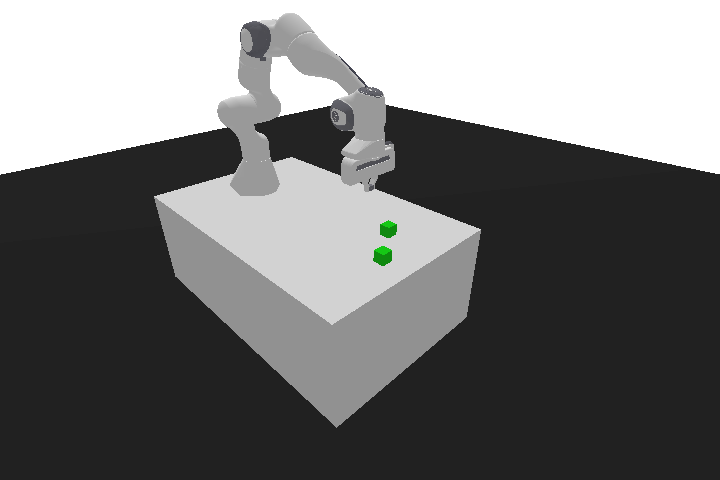

In [10]:
Image(filename="anim.png")

## Plotting the results from the saved model

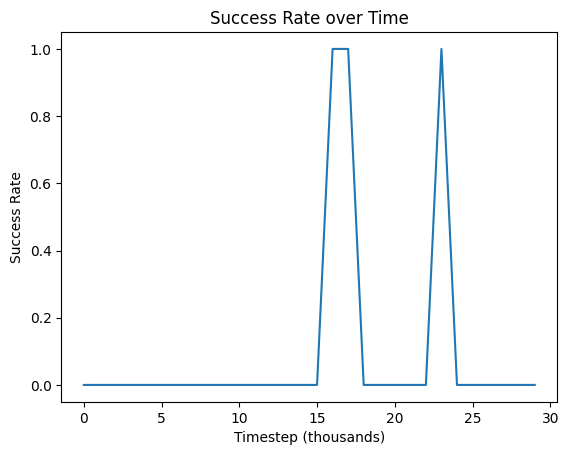

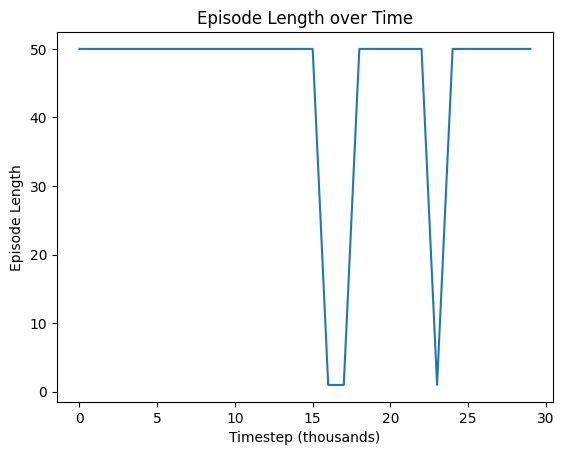

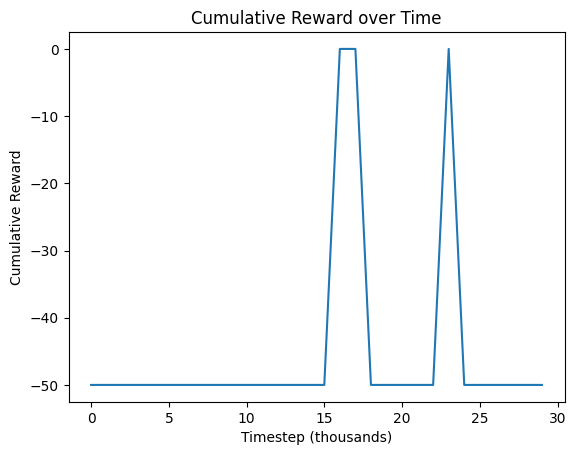

In [13]:
# Plot success rate
plt.plot(success_rates)
plt.xlabel('Timestep (thousands)')
plt.ylabel('Success Rate')
plt.title('Success Rate over Time')
plt.show()

# Plot episode length
plt.plot(episode_lengths)
plt.xlabel('Timestep (thousands)')
plt.ylabel('Episode Length')
plt.title('Episode Length over Time')
plt.show()

# Plot cumulative reward
plt.plot(cumulative_rewards)
plt.xlabel('Timestep (thousands)')
plt.ylabel('Cumulative Reward')
plt.title('Cumulative Reward over Time')
plt.show()

## Close environment

In [ ]:
env2.close()